In [316]:
import sys
from netCDF4 import Dataset
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
#Generates blank plots when saving unless called in same cell
#%matplotlib inline
from mpl_toolkits.basemap import Basemap
from pathlib import Path
from subprocess import Popen
import itertools

from pyproj import Proj
import pyproj
import xarray as xr
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from pyresample import image, geometry
import metpy
import seaborn as sns
sns.set(style="darkgrid")
import pandas as pd
import statsmodels.api as sm
import os
import os.path as op
from glob import glob
from convertdate import gregorian, ordinal
from multiprocessing import Pool

import warnings
#warnings.filterwarnings('ignore')

import logging
import cv2
from PIL import Image

In [313]:
path = '/home/radomako/test_set_color/sharkfin/OR_ABI-L1b-RadF-M6C11_G17_s20200400620319_e20200400629386_c20200400629453_UTC_5424x5424.png'
myImage = Image.open(path)

In [314]:
myImage;

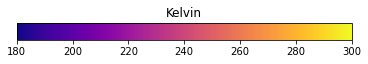

In [141]:
fig, ax = plt.subplots()
im = plt.imshow(myImage, cmap='plasma',vmin=180,vmax=300)
plt.grid(None)
plt.axis('off')
plt.colorbar(orientation='horizontal')
ax.remove()
plt.title('Kelvin')
plt.savefig('GOES_plasma_cbar.png', dpi = 600)

In [143]:
logger = logging.getLogger()

fullDisk = '/arcdata/goes/grb/goes'
storage = '/apollo/awg_imagery/radomako'

def Rad2BT(rad, planck_fk1, planck_fk2, planck_bc1, planck_bc2):
    """Radiances to Brightness Temprature (using black body equation)"""
    
    planck_fk1 = abs(planck_fk1)
    planck_fk2 = abs(planck_fk2)
    planck_bc1 = abs(planck_bc1)
    planck_bc2 = abs(planck_bc2)
    
    invRad = np.array(abs(rad))**(-1)
    arg = (invRad*planck_fk1) + 1.0
    T = (- planck_bc1+(planck_fk2 * (np.log(arg)**(-1))) )*(1/planck_bc2)
    return T



/home/radomako/.conda/envs/adomako/lib/python3.9/site-packages/pyresample/bilinear/__init__.py:50: UserWarning: XArray and/or zarr not found, XArrayBilinearResampler won't be available.
  warnings.warn("XArray and/or zarr not found, XArrayBilinearResampler won't be available.")


In [144]:
SAMPLE_img = '/scratch/radomako/mydataset4/fillin/FD_goes16_B08_2021-01-01_001_000020UTC_224x224_BW.jpg'

In [145]:
file = '/arcdata/goes/grb/goes16/2021/2021_01_01_001/abi/L1b/RadF/OR_ABI-L1b-RadF-M6C08_G16_s20210010000209_e20210010009517_c20210010009581.nc'

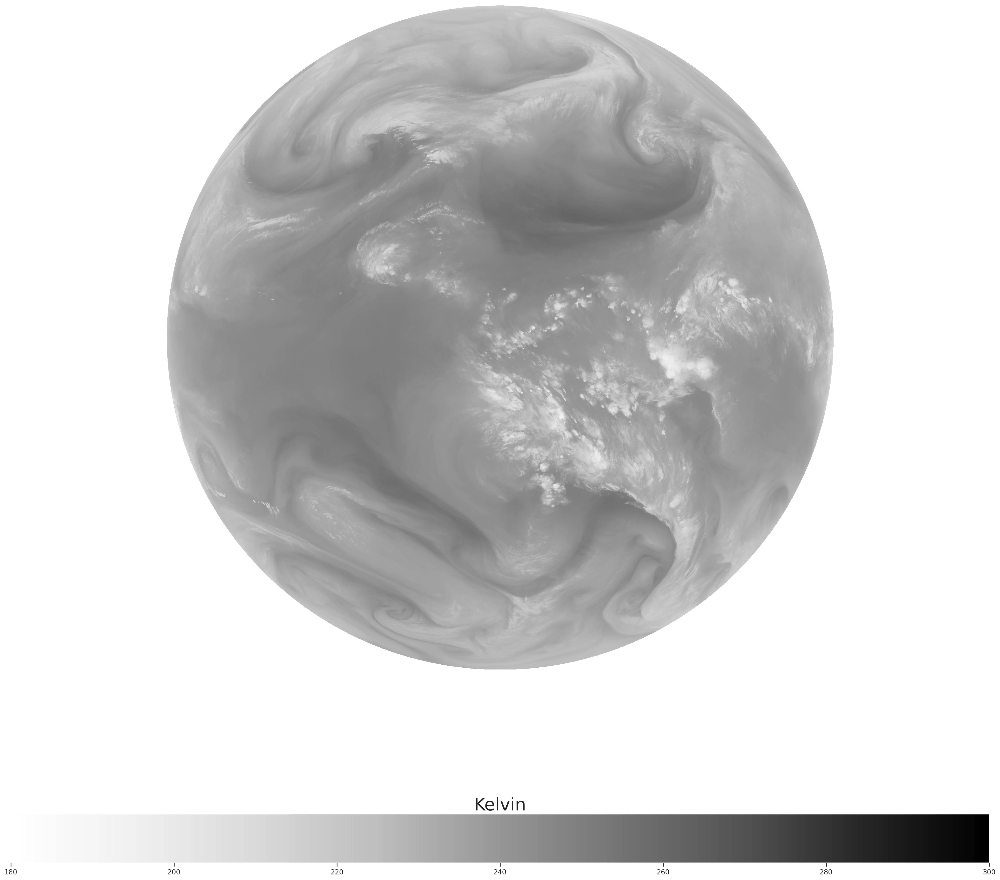

In [159]:
GOES_R = xr.open_dataset(file)
GOES_image = GOES_R['Rad']

planck_fk1 = float(GOES_R['planck_fk1'].data)
planck_fk2 = float(GOES_R['planck_fk2'].data) 
planck_bc1 = float(GOES_R['planck_bc1'].data)                       
planck_bc2 = float(GOES_R['planck_bc2'].data)
'''
Need not convert projection: using full image, no pyproj interpolation of region of interest
'''

Kelvin_GOES = Rad2BT(GOES_image, \
                     planck_fk1, \
                     planck_fk2, \
                     planck_bc1, \
                     planck_bc2)

my_dpi = 192#96#
#resolution = 5424
downsize_x = 5424#224
downsize_y = 5424#224

'''Call pixelage before rendering'''
plt.figure(figsize=(downsize_x/my_dpi, downsize_y/my_dpi), dpi=my_dpi)
# plt.figure()

plt.grid(None)
plt.axis('off')
#             title = f'Brightness Temperature in Kelvin \n Full Disk GOES-{SS} Image Band{bb}'
#             ttl = plt.title(f"{title}\n Date {mm}-{dd}, Year {yyyy}, \n Day {DDD}, Time {HH}:{MM}:{ss}",\
#                        fontsize="x-large", fontweight='bold', pad = 6.0)
#             ttl.set_position([.5, 1.05])
fig1=plt.imshow(Kelvin_GOES, cmap='Greys',vmin=180,vmax=300)#light to dark
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_title('Kelvin', fontsize=28)

plt.savefig("Control.png")

In [160]:
found = '/arcdata/goes/grb/goes16/2019/2019_03_22_081/abi/L1b/RadF/OR_ABI-L1b-RadF-M3C11_G16_s20190812045368_e20190812056135_c20190812056192.nc'

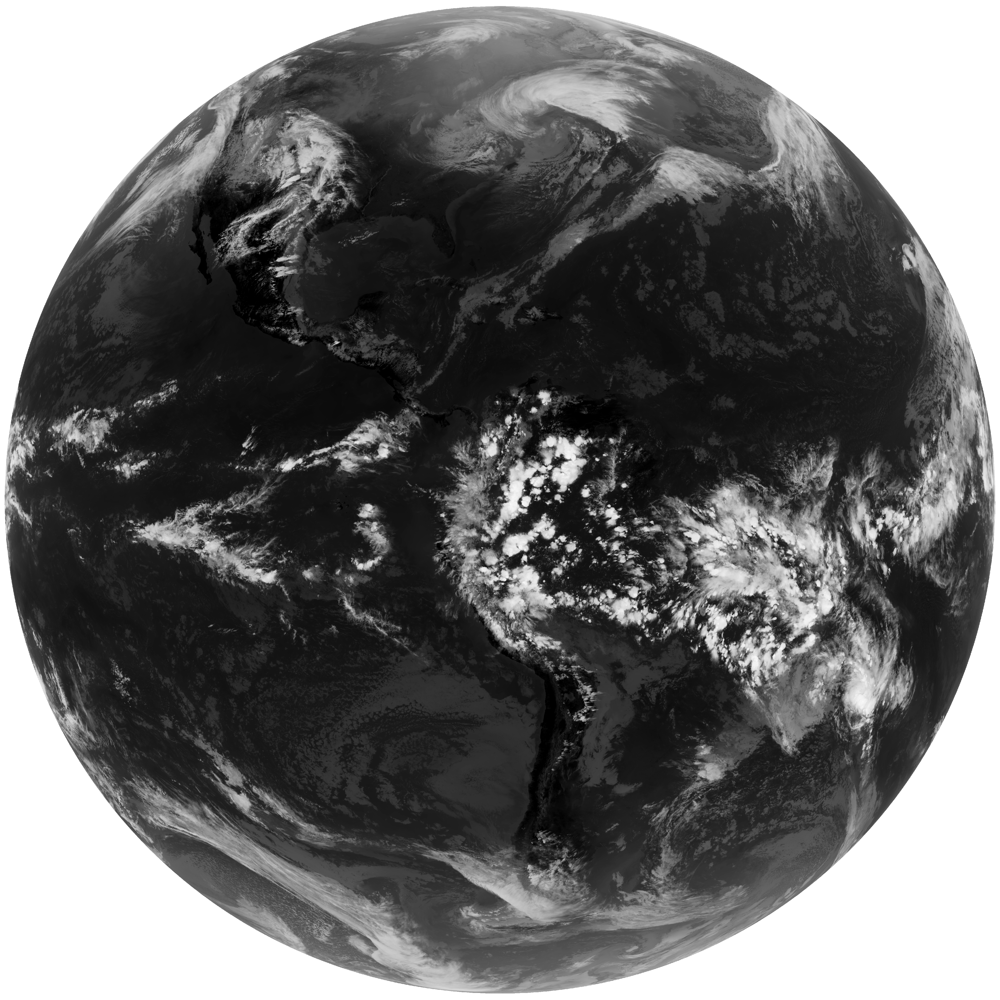

In [162]:
GOES_R = xr.open_dataset(found)
GOES_image = GOES_R['Rad']

planck_fk1 = float(GOES_R['planck_fk1'].data)
planck_fk2 = float(GOES_R['planck_fk2'].data) 
planck_bc1 = float(GOES_R['planck_bc1'].data)                       
planck_bc2 = float(GOES_R['planck_bc2'].data)
'''
Need not convert projection: using full image, no pyproj interpolation of region of interest
'''

Kelvin_GOES = Rad2BT(GOES_image, \
                     planck_fk1, \
                     planck_fk2, \
                     planck_bc1, \
                     planck_bc2)

my_dpi = 192#96#
#resolution = 5424
downsize_x = 224
downsize_y = 224
# downsize_x = 5424#224
# downsize_y = 5424#224

'''Call pixelage before rendering'''
plt.figure(figsize=(downsize_x/my_dpi, downsize_y/my_dpi), dpi=my_dpi)
# plt.figure()

plt.grid(None)
plt.axis('off')
#             title = f'Brightness Temperature in Kelvin \n Full Disk GOES-{SS} Image Band{bb}'
#             ttl = plt.title(f"{title}\n Date {mm}-{dd}, Year {yyyy}, \n Day {DDD}, Time {HH}:{MM}:{ss}",\
#                        fontsize="x-large", fontweight='bold', pad = 6.0)
#             ttl.set_position([.5, 1.05])
fig1=plt.imshow(Kelvin_GOES, cmap='Greys',vmin=180,vmax=300)#light to dark
#cbar = plt.colorbar(orientation='horizontal')
#cbar.ax.set_title('Kelvin', fontsize=28)

plt.savefig("Sample_found.png")

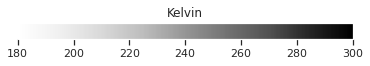

In [164]:
fig, ax = plt.subplots()
im = plt.imshow(myImage, cmap='Greys',vmin=180,vmax=300)
plt.grid(None)
plt.axis('off')
plt.colorbar(orientation='horizontal')
ax.remove()
plt.title('Kelvin')
plt.savefig('BW_cbar.png', dpi = 600)

In [317]:
errorFile = open('Error_log_AMS_G16_B11_artifacts_FD.txt','r')
for line in errorFile:
    True#print(line)
errorFile.close()

In [177]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
 
img_array = []
#size = (1,1)

errorFile = open('Error_log_AMS_G16_B11_artifacts_FD.txt','r')

# for filename in glob.glob('../Mean_temp_filtered/*.png'):
for line in errorFile:
    filename = str(line)
    print(filename)
    img = cv2.imread(filename)
    print(img)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
    
#print (size) 
out = cv2.VideoWriter('BW_AMS_found_Errors.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

errorFile.close()

/apollo/awg_imagery/radomako/2019/081/FD_goes16_B11_2019-03-22_081_204536UTC_224x224_BW.png

None


AttributeError: 'NoneType' object has no attribute 'shape'

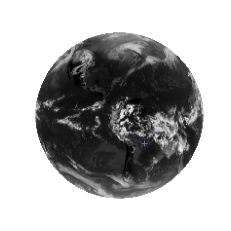

In [238]:
errorFile = open('Error_log_AMS_G16_B11_artifacts_FD.txt','r')
ref = list(errorFile)[0][:-1]
plt_img = plt.imread(ref)

plt.grid('None')
plt.axis('off')

plt.imshow(plt_img);
plt.plot(140, 140, 'b+')

In [327]:
nr.seed = 42
#SAMPLE_img = '/apollo/awg_imagery/radomako/2021/001/FD_goes16_B08_2021-01-01_001_000020UTC_224x224_BW.png'
SAMPLE_img = '/scratch/radomako/mydataset4/fillin/FD_goes16_B08_2021-01-01_001_000020UTC_224x224_BW.jpg'
dat = plt.imread(SAMPLE_img)
G16sample = np.array(dat)
df = pd.DataFrame(G16sample)
df_deepSpace = df%255==0

error = 0
errorFile = open('Error_log_AMS_G16_B11_artifacts_FD.txt','r') 

for line in errorFile:
#     filename = str(line)
#     print(filename)
#     img = cv2.imread(filename)
#     print(img)
#     height, width, layers = img.shape
#     size = (width,height)
#     img_array.append(img)
    file = line[:-1]
    try:
        datSamp = plt.imread(file)
        sample = np.array(datSamp)
        df_samp = pd.DataFrame(sample)
        print(f'{file} pandas\n')
        df_samp = df_samp%255==0
        'Compare Booleans- vs comparing 256 hexadecimal numbers'
        if df_deepSpace.equals(df_samp) == False:
            #True
            print(df_samp)
#             print(f'{file}\n')
#             counter+=1
#             log.write(f'{file}\n')
#             print(f'Artifact file: {file}\n')
        break
    except:
        #errors.append(file)
        error+=1

In [341]:
found = '/arcdata/goes/grb/goes16/2021/2021_01_01_001/abi/L1b/RadF/OR_ABI-L1b-RadF-M6C08_G16_s20210010000209_e20210010009517_c20210010009581.nc'

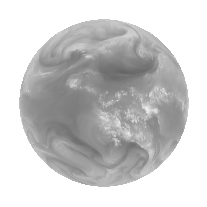

In [342]:
GOES_R = xr.open_dataset(found)
GOES_image = GOES_R['Rad']

planck_fk1 = float(GOES_R['planck_fk1'].data)
planck_fk2 = float(GOES_R['planck_fk2'].data) 
planck_bc1 = float(GOES_R['planck_bc1'].data)                       
planck_bc2 = float(GOES_R['planck_bc2'].data)
'''
Need not convert projection: using full image, no pyproj interpolation of region of interest
'''

Kelvin_GOES = Rad2BT(GOES_image, \
                     planck_fk1, \
                     planck_fk2, \
                     planck_bc1, \
                     planck_bc2)

my_dpi = 192#96#
#resolution = 5424
downsize_x = 224
downsize_y = 224
# downsize_x = 5424#224
# downsize_y = 5424#224

'''Call pixelage before rendering'''
plt.figure(figsize=(downsize_x/my_dpi, downsize_y/my_dpi), dpi=my_dpi)
# plt.figure()

plt.grid(None)
plt.axis('off')
#             title = f'Brightness Temperature in Kelvin \n Full Disk GOES-{SS} Image Band{bb}'
#             ttl = plt.title(f"{title}\n Date {mm}-{dd}, Year {yyyy}, \n Day {DDD}, Time {HH}:{MM}:{ss}",\
#                        fontsize="x-large", fontweight='bold', pad = 6.0)
#             ttl.set_position([.5, 1.05])
    
fig1=plt.imshow(Kelvin_GOES, cmap='Greys',vmin=180,vmax=300)#light to dark
#cbar = plt.colorbar(orientation='horizontal')
#cbar.ax.set_title('Kelvin', fontsize=28)

plt.savefig(f"images/Test_Artifacts/FD_goes16_B11_2019-03-22_081_204536UTC_224x224_BW.jpg")

In [360]:
reArray

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

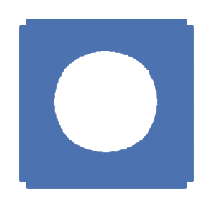

In [367]:
markers = []

redraw = plt.imread("images/Test_Artifacts/FD_goes16_B11_2019-03-22_081_204536UTC_224x224_BW.jpg")
#redraw = plt.imshow(redraw, cmap='Greys')
reArray = np.array(redraw)
# reArray.reshape(3,224,224)
# print(reArray.shape)
for i in range(224):
    for j in range(224):
        #print (reArray)
        if (reArray[i,j][0]%255==0): 
            if (reArray[i,j][1]%255==0):
                if (reArray[i,j][2]%255==0):
                    markers.append((i,j))
                                                                         
my_dpi = 192#96#
#resolution = 5424
downsize_x = 224
downsize_y = 224
# downsize_x = 5424#224
# downsize_y = 5424#224

'''Call pixelage before rendering'''
plt.figure(figsize=(downsize_x/my_dpi, downsize_y/my_dpi), dpi=my_dpi)
plt.grid(None)
plt.axis('off')
for mark in markers:
    plt.plot(mark[0], mark[1], 'b+')

plt.savefig(f"images/Test_Artifacts/FD_goes16_B11_2019-03-22_081_204536UTC_224x224_BW_mark.jpg")